In [14]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Conv2D, Conv2DTranspose, MaxPooling2D, Dropout, Flatten, Concatenate, Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping,TensorBoard,LearningRateScheduler
from keras.applications import VGG16, ResNet50, EfficientNetB0, DenseNet121

from datetime import datetime
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
url = 'https://github.com/Horea94/Fruit-Images-Dataset/archive/master.zip'
name = 'fruits360'
file = tf.keras.utils.get_file(name,url,extract=True)

   8192/Unknown - 0s 0us/step

In [3]:
import os

# 指定訓練資料夾目錄
training_path = os.path.sep.join(file.split(os.path.sep)[0:-1]+['Fruit-Images-Dataset-master','Training'])
test_path     = os.path.sep.join(file.split(os.path.sep)[0:-1]+['Fruit-Images-Dataset-master','Test'])

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,validation_split=0.1)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(training_path,target_size=(100,100),batch_size=32,class_mode='sparse',subset='training')
valid_generator = train_datagen.flow_from_directory(training_path,target_size=(100,100),batch_size=32,class_mode='sparse',subset='validation')
test_generator  = test_datagen.flow_from_directory(test_path,target_size=(100,100),batch_size=32,class_mode='sparse')

Found 60955 images belonging to 131 classes.
Found 6737 images belonging to 131 classes.
Found 22688 images belonging to 131 classes.


In [4]:
#Print sample class
print(list(train_generator.class_indices.keys())[1])

#Print Total train image and total class
print(train_generator.n, train_generator.num_classes)

Apple Crimson Snow
60955 131


**Data Visualization**

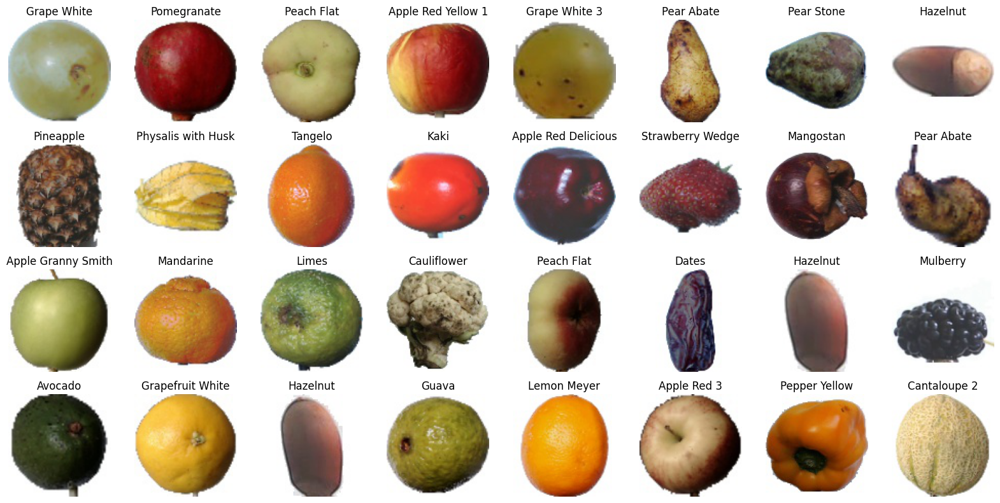

In [5]:
import matplotlib.pyplot as plt

indices_class = {v:name for name,v in train_generator.class_indices.items()}

def plot_image_grid(generator, class_indices, grid_shape=(4, 8), figsize=(16, 8)):
    indices_class = {v: name for name, v in class_indices.items()}

    (X, y) = generator.next()

    plt.figure(figsize=figsize)
    for i in range(X.shape[0]):
        plt.subplot(grid_shape[0], grid_shape[1], i + 1)
        plt.imshow(X[i])
        plt.title(indices_class[int(y[i])])
        plt.axis(False)
    plt.tight_layout()
    plt.show()

#Train data
plot_image_grid(train_generator, train_generator.class_indices)

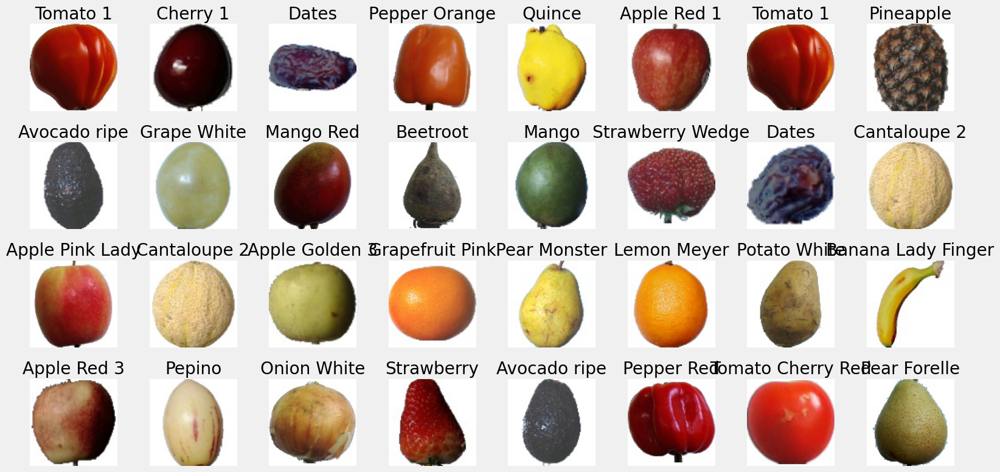

In [29]:
#Validation Data
plot_image_grid(valid_generator, valid_generator.class_indices)

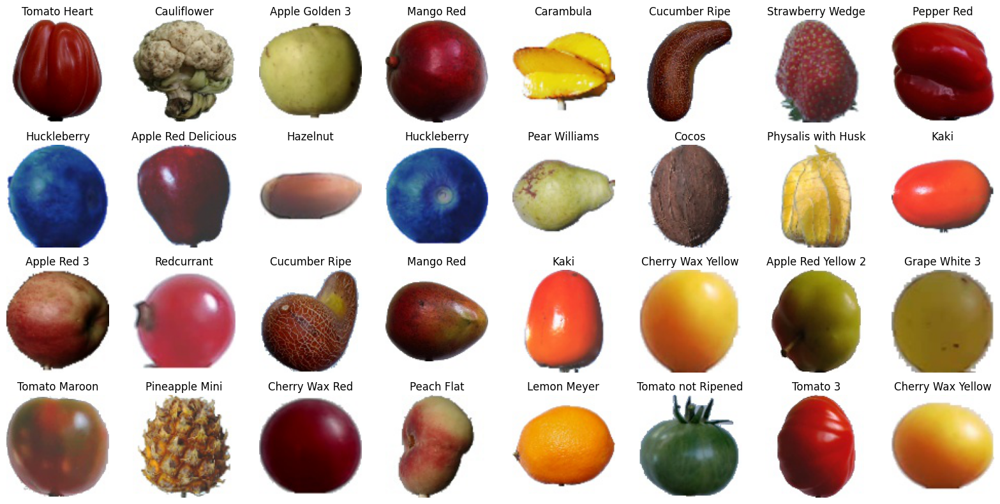

In [7]:
#Test Data
plot_image_grid(test_generator, test_generator.class_indices)

In [8]:
print("Total Class:",len(indices_class))

Total Class: 131


# CNN with Pretrained Model

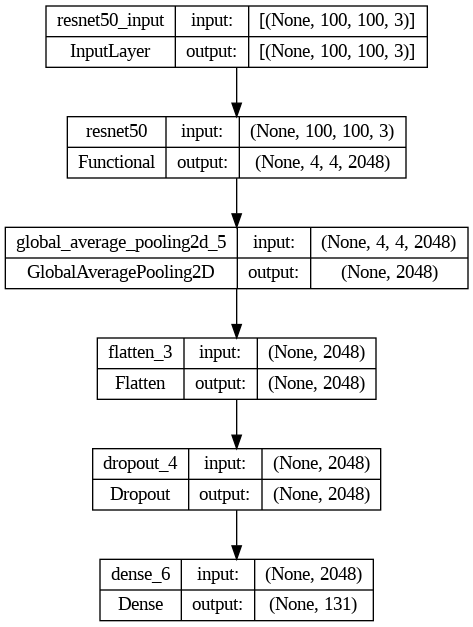

In [ ]:
# Define the input shape
input_shape = (100, 100, 3)
# Pretrained model
resnet = ResNet50(weights=None, include_top=False, input_shape=input_shape)
#vgg = VGG16(Weights=None, include_top=False, input_shape=input_shape)

def model(pretrained_model):
    model = Sequential()
    model.add(pretrained_model)
    model.add(GlobalAveragePooling2D())
    model.add(Flatten())
    model.add(Dropout(0.2))
    model.add(Dense(131, activation='softmax'))
    display(tf.keras.utils.plot_model(model, to_file='cnn.png', show_shapes=True))
    

    return model

CNN = model(resnet)

In [ ]:
CNN.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d_5   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 flatten_3 (Flatten)         (None, 2048)              0         
                                                                 
 dropout_4 (Dropout)         (None, 2048)              0         
                                                                 
 dense_6 (Dense)             (None, 131)               268419    
                                                                 
Total params: 23,856,131
Trainable params: 23,803,011
Non-trainable params: 53,120
_____________________________________

In [ ]:
LEARNING_RATE = 0.0001
EPOCHS = 50

CNN.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=['accuracy']
)

In [ ]:
def scheduler(epoch, lr):
      if epoch < 5:
        return lr
      else:
        return lr * tf.math.exp(-0.1)

log_dir='./logs/fit'+datetime.now().strftime('%d.%m.%Y--%H-%M-%S')
model_path='/content/cnn1.h5'
checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy',
                             verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto',
                             save_freq='epoch')
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=10,verbose=1, mode='auto')
board=TensorBoard(log_dir=log_dir,histogram_freq=1)
dec=LearningRateScheduler(scheduler)
tensorboard_callback =[checkpoint,early,board,dec]

In [ ]:
hist = CNN.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=EPOCHS,
    steps_per_epoch=len(train_generator),
    validation_steps=len(valid_generator),
    callbacks=[tensorboard_callback]
)

Epoch 1/50
1904/1905 [============================>.] - ETA: 0s - loss: 0.8387 - accuracy: 0.7816
Epoch 1: val_accuracy improved from -inf to 0.93914, saving model to /content/cnn1.h5
1905/1905 [==============================] - 147s 57ms/step - loss: 0.8384 - accuracy: 0.7816 - val_loss: 0.1771 - val_accuracy: 0.9391 - lr: 1.0000e-04
Epoch 2/50
1904/1905 [============================>.] - ETA: 0s - loss: 0.1145 - accuracy: 0.9649
Epoch 2: val_accuracy improved from 0.93914 to 0.95369, saving model to /content/cnn1.h5
1905/1905 [==============================] - 107s 56ms/step - loss: 0.1145 - accuracy: 0.9649 - val_loss: 0.1888 - val_accuracy: 0.9537 - lr: 1.0000e-04
Epoch 3/50
1904/1905 [============================>.] - ETA: 0s - loss: 0.0790 - accuracy: 0.9765
Epoch 3: val_accuracy did not improve from 0.95369
1905/1905 [==============================] - 106s 56ms/step - loss: 0.0792 - accuracy: 0.9765 - val_loss: 0.4432 - val_accuracy: 0.8995 - lr: 1.0000e-04
Epoch 4/50
1905/1905 

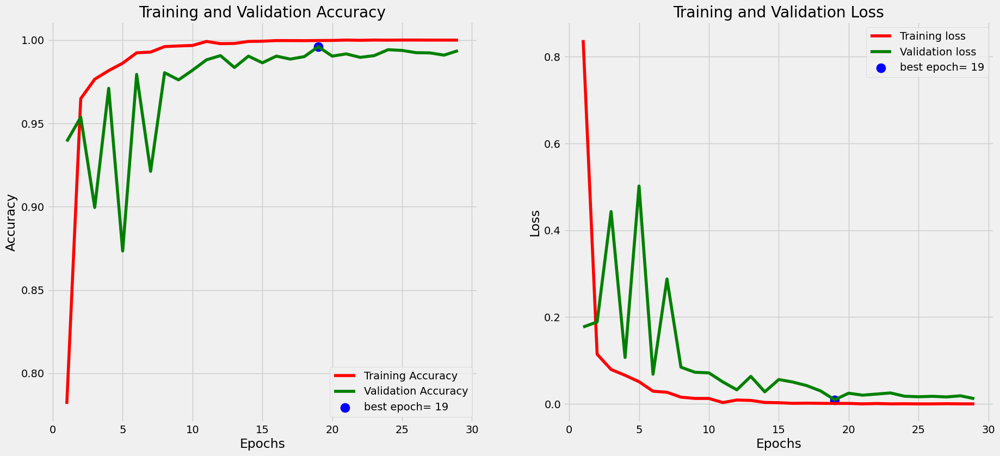

In [ ]:
import numpy as np

def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

plot_training(hist)

In [ ]:
ts_length = 22688
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

test_score = CNN.evaluate(test_generator, steps= test_steps, verbose= 1)

print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

709/709 [==============================] - 20s 28ms/step - loss: 0.0538 - accuracy: 0.9882
Test Loss:  0.053813349455595016
Test Accuracy:  0.9881876111030579


1/1 [==============================] - 0s 29ms/step


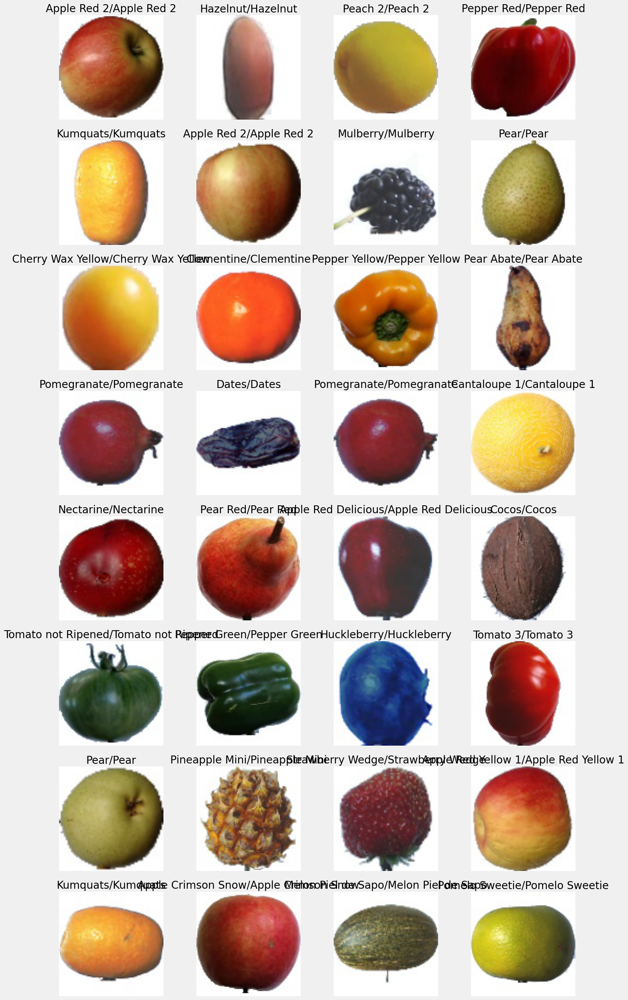

In [ ]:
(X,y)=test_generator.next()
py   = CNN.predict(X)
plt.figure(figsize=(16,32))
for i in range(X.shape[0]):
    plt.subplot(8,4,i+1)
    plt.imshow(X[i])
    plt.title(indices_class[np.argmax(py[i])]+'/'+indices_class[int(y[i])])
    plt.axis(False)   
plt.show()   

# CNN with at least one block (InceptionBlock, ResBlock, and DenseBlock.)

In [ ]:
# Inception Block
#             Filter      Concat
#    _________| |         |    |________
#   |           |         |             |
#  1x1 Conv    3x3 Conv   5x5 Conv     3x3 MaxPooling

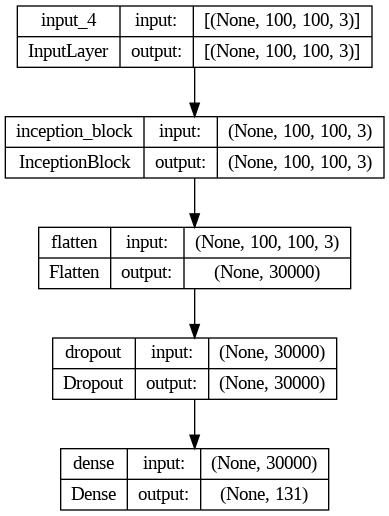

In [18]:
from tensorflow.keras.layers import Layer

input_shape = (100,100,3)


class InceptionBlock(Layer):
    def __init__(self):
        super(InceptionBlock, self).__init__()
        self.tower11 = Conv2D(64, (1, 1), padding='same', activation='relu')
        self.tower12 = Conv2D(64, (3, 3), padding='same', activation='relu')

        self.tower21 = Conv2D(64, (1, 1), padding='same', activation='relu')
        self.tower22 = Conv2D(64, (5, 5), padding='same', activation='relu')

        self.tower31 = MaxPooling2D((3, 3), strides=(1, 1), padding='same')
        self.tower32 = Conv2D(64, (1, 1), padding='same', activation='relu')

        def call(self, inputs):
          tower1_output = self.tower12(self.tower1(inputs))
          tower2_output = self.tower22(self.tower2(inputs))
          tower3_output = self.tower33(self.tower3(inputs))
          output = Concatenate()([tower1_output, tower2_output, tower3_output])
          return output


def model2():
  model = Sequential()
  model.add(Input(shape=input_shape))
  model.add(InceptionBlock())
  model.add(Flatten())
  model.add(Dropout(0.2))
  model.add(Dense(131, activation='softmax'))
  display(tf.keras.utils.plot_model(model, to_file='cnn2.png', show_shapes=True))

  return model

CNN2 = model2()

In [19]:
CNN2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_block (InceptionB  (None, 100, 100, 3)      0         
 lock)                                                           
                                                                 
 flatten (Flatten)           (None, 30000)             0         
                                                                 
 dropout (Dropout)           (None, 30000)             0         
                                                                 
 dense (Dense)               (None, 131)               3930131   
                                                                 
Total params: 3,930,131
Trainable params: 3,930,131
Non-trainable params: 0
_________________________________________________________________


In [21]:
LEARNING_RATE = 0.0001
EPOCHS = 50

CNN2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=['accuracy']
)

In [22]:
def scheduler(epoch, lr):
      if epoch < 5:
        return lr
      else:
        return lr * tf.math.exp(-0.1)

log_dir='./logs/fit'+datetime.now().strftime('%d.%m.%Y--%H-%M-%S')
model_path='/content/cnn2.h5'
checkpoint = ModelCheckpoint(model_path, monitor='val_accuracy',
                             verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto',
                             save_freq='epoch')
early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=10,verbose=1, mode='auto')
board=TensorBoard(log_dir=log_dir,histogram_freq=1)
dec=LearningRateScheduler(scheduler)
tensorboard_callback =[checkpoint,early,board,dec]

In [24]:
hist2 = CNN2.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=EPOCHS,
    steps_per_epoch=len(train_generator),
    validation_steps=len(valid_generator),
    callbacks=[tensorboard_callback]
)

Epoch 1/50
1904/1905 [============================>.] - ETA: 0s - loss: 0.5927 - accuracy: 0.8504
Epoch 1: val_accuracy improved from -inf to 0.86611, saving model to /content/cnn2.h5
1905/1905 [==============================] - 47s 25ms/step - loss: 0.5925 - accuracy: 0.8504 - val_loss: 0.5397 - val_accuracy: 0.8661 - lr: 1.0000e-04
Epoch 2/50
1905/1905 [==============================] - ETA: 0s - loss: 0.2297 - accuracy: 0.9415
Epoch 2: val_accuracy improved from 0.86611 to 0.87532, saving model to /content/cnn2.h5
1905/1905 [==============================] - 44s 23ms/step - loss: 0.2297 - accuracy: 0.9415 - val_loss: 0.5220 - val_accuracy: 0.8753 - lr: 1.0000e-04
Epoch 3/50
1903/1905 [============================>.] - ETA: 0s - loss: 0.1456 - accuracy: 0.9610
Epoch 3: val_accuracy improved from 0.87532 to 0.88096, saving model to /content/cnn2.h5
1905/1905 [==============================] - 44s 23ms/step - loss: 0.1456 - accuracy: 0.9610 - val_loss: 0.5008 - val_accuracy: 0.8810 - l

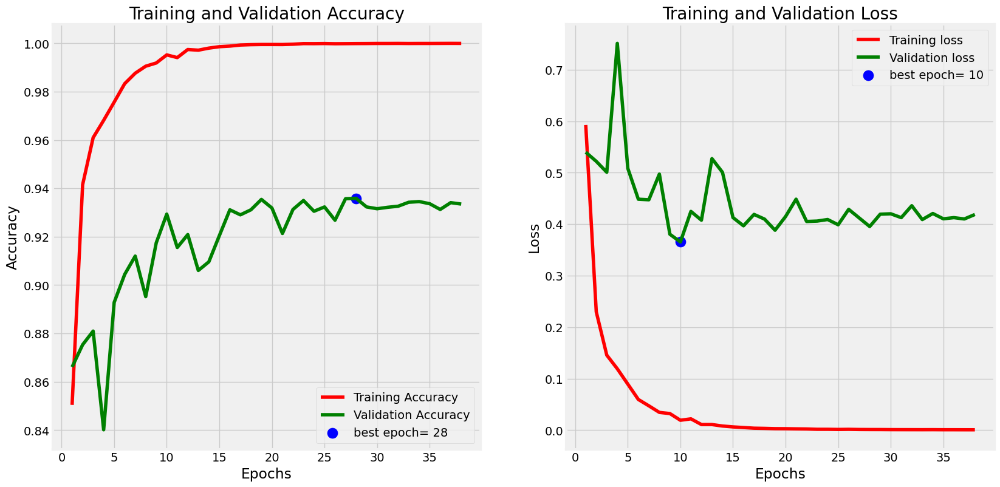

In [26]:
import numpy as np

def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

plot_training(hist2)

In [27]:
ts_length = 22688
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

test_score = CNN2.evaluate(test_generator, steps= test_steps, verbose= 1)

print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

709/709 [==============================] - 14s 20ms/step - loss: 0.6473 - accuracy: 0.9078
Test Loss:  0.6472960114479065
Test Accuracy:  0.9078367352485657


1/1 [==============================] - 0s 73ms/step


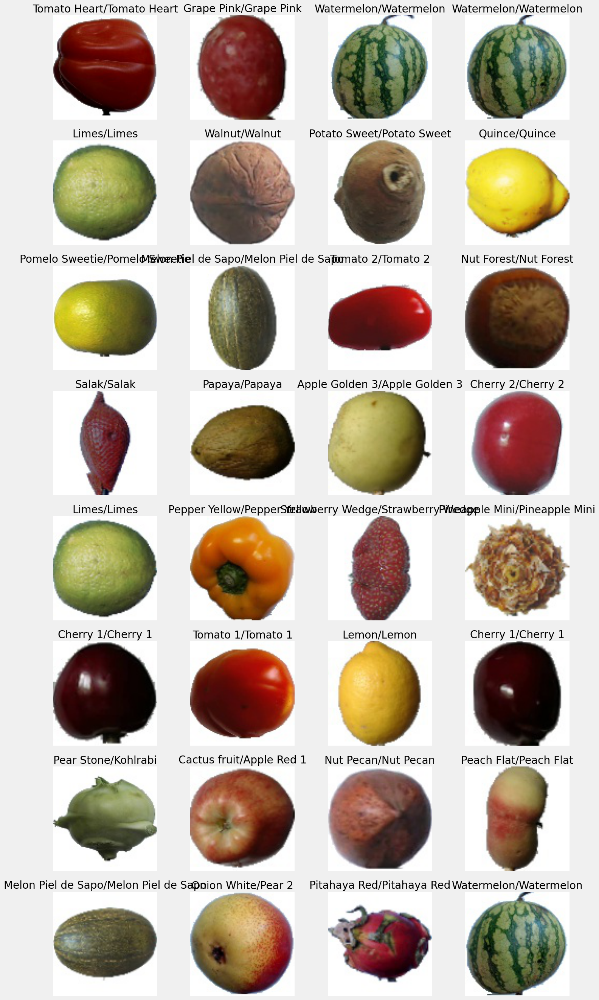

In [28]:
(X,y)=test_generator.next()
py   = CNN2.predict(X)
plt.figure(figsize=(16,32))
for i in range(X.shape[0]):
    plt.subplot(8,4,i+1)
    plt.imshow(X[i])
    plt.title(indices_class[np.argmax(py[i])]+'/'+indices_class[int(y[i])])
    plt.axis(False)   
plt.show() 